<a href="https://colab.research.google.com/github/Youssef8323/Code-Cosmetics/blob/main/S3_Solution_Decision_Trees_PyhtonNoteBook_15102023_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn import tree


In [ ]:
#import pandas
import pandas as pd
# load dataset
pima = pd.read_csv('/content/diabetes.csv')
pima.head()


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
#split dataset in features and target variable
feature_cols = ['Pregnancies', 'Insulin', 'BMI', 'Age','Glucose','DiabetesPedigreeFunction']
X = pima[feature_cols] # Features
y = pima.Outcome # Target variable


In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test


In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


In [ ]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7142857142857143


In [ ]:
#You can view the tree in text format which is tedious
text_representation = tree.export_text(clf)
print(text_representation)


|--- feature_4 <= 129.50
|   |--- feature_2 <= 26.30
|   |   |--- feature_2 <= 9.10
|   |   |   |--- feature_0 <= 7.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_0 >  7.50
|   |   |   |   |--- class: 1
|   |   |--- feature_2 >  9.10
|   |   |   |--- feature_5 <= 0.67
|   |   |   |   |--- class: 0
|   |   |   |--- feature_5 >  0.67
|   |   |   |   |--- feature_5 <= 0.71
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_5 >  0.71
|   |   |   |   |   |--- class: 0
|   |--- feature_2 >  26.30
|   |   |--- feature_3 <= 27.50
|   |   |   |--- feature_2 <= 45.40
|   |   |   |   |--- feature_0 <= 7.00
|   |   |   |   |   |--- feature_3 <= 22.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_3 >  22.50
|   |   |   |   |   |   |--- feature_2 <= 30.45
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_2 >  30.45
|   |   |   |   |   |   |   |--- feature_5 <= 1.27
|   |   |   |   |   |   |   |   |--- feature_5 <= 0.15
|   

In [ ]:
from sklearn import tree
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(clf, feature_names=feature_cols, class_names=['0','1'], filled=True)


In [ ]:
#To save the DT graph
fig.savefig("decistion_tree.png")


In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.7705627705627706


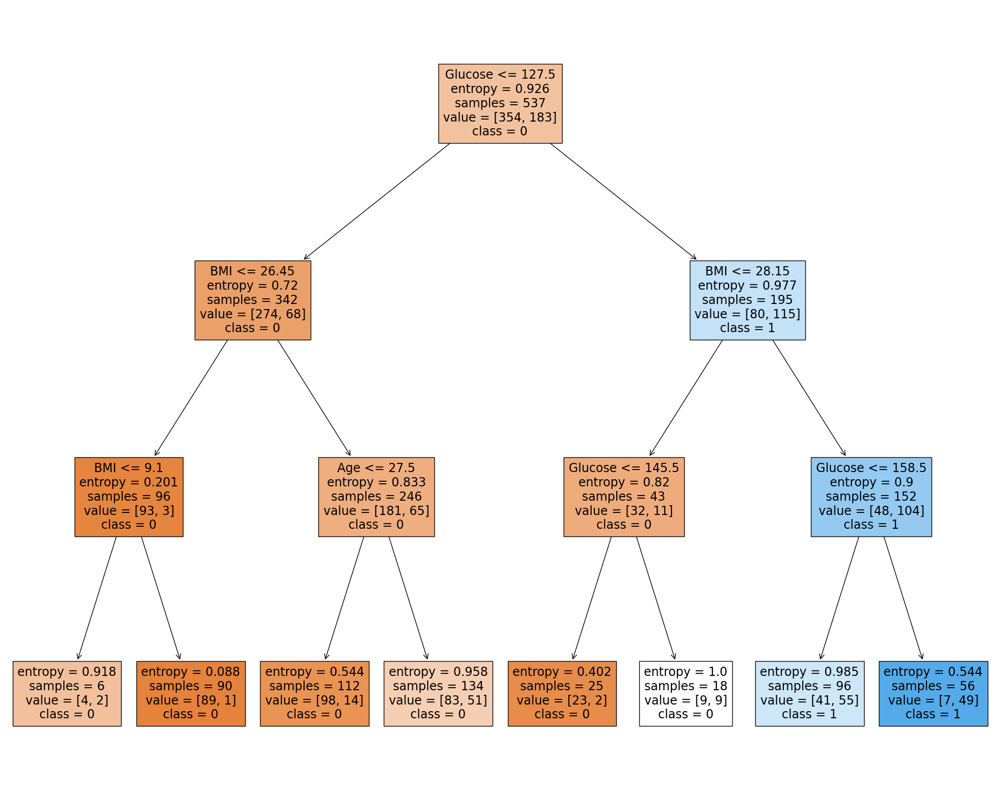

In [ ]:
from sklearn import tree
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(25,20))
DT_Graph_pruned = tree.plot_tree(clf, feature_names=feature_cols, class_names=['0','1'],filled=True)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test,y_pred)
print (accuracy)

# import the metrics class
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix


0.7705627705627706


array([[124,  22],
       [ 31,  54]])

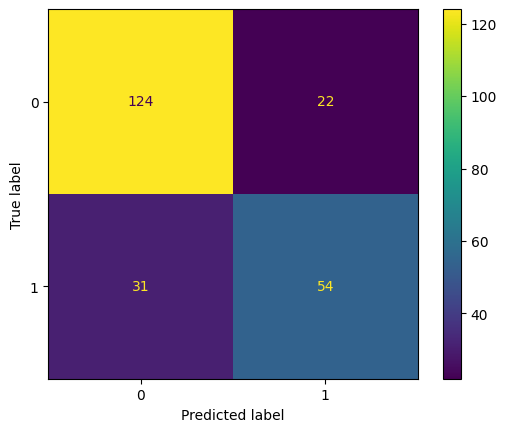

In [ ]:
# An easier way to plot the confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(cm,display_labels=clf.classes_)
disp.plot()


Text(0.5, 427.9555555555555, 'Predicted label')

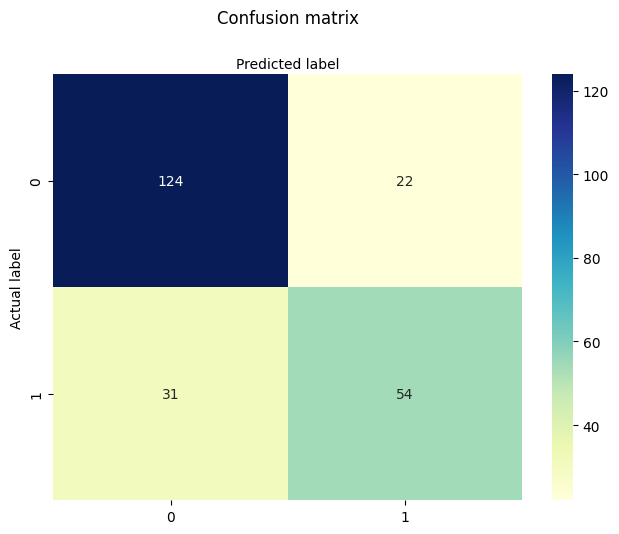

In [ ]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))


Accuracy: 0.7705627705627706
Precision: 0.7105263157894737
Recall: 0.6352941176470588


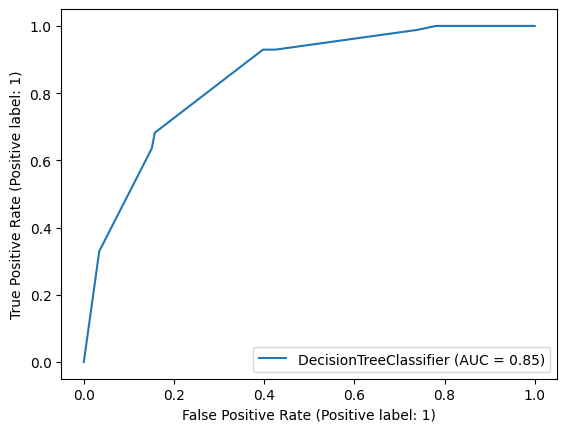

In [ ]:
#from sklearn.metrics import plot_roc_curve
#plot_roc_curve(clf, X_test, y_test)
from sklearn.metrics import RocCurveDisplay
clf = RocCurveDisplay.from_estimator(clf, X_test, y_test)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#Importing the Dataset
dataset = pd.read_csv('/content/petrol_consumption.csv')


In [ ]:
dataset.head()

,Petrol_tax,Average_income,Paved_Highways,Population_Driver_licence(%),Petrol_Consumption
0,9.0,3571,1976,0.525,541
1,9.0,4092,1250,0.572,524
2,9.0,3865,1586,0.580,561
3,7.5,4870,2351,0.529,414
4,8.0,4399,431,0.544,410


In [ ]:
dataset.describe()

,Petrol_tax,Average_income,Paved_Highways,Population_Driver_licence(%),Petrol_Consumption
count,48.000000,48.000000,48.000000,48.000000,48.000000
mean,7.668333,4241.833333,5565.416667,0.570333,576.770833
std,0.950770,573.623768,3491.507166,0.055470,111.885816
min,5.000000,3063.000000,431.000000,0.451000,344.000000
25%,7.000000,3739.000000,3110.250000,0.529750,509.500000
50%,7.500000,4298.000000,4735.500000,0.564500,568.500000
75%,8.125000,4578.750000,7156.000000,0.595250,632.750000
max,10.000000,5342.000000,17782.000000,0.724000,968.000000


In [ ]:
X = dataset.drop('Petrol_Consumption', axis=1)
y = dataset['Petrol_Consumption']


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


In [ ]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor()
regressor.fit(X_train, y_train)
#To make predictions on the test set, ues the predict method:
y_pred = regressor.predict(X_test)

In [ ]:
df=pd.DataFrame({'Actual':y_test, 'Predicted':y_pred})
df

,Actual,Predicted
29,534,541.0
4,410,414.0
26,577,554.0
30,571,554.0
32,577,631.0
37,704,644.0
34,487,628.0
40,587,540.0
7,467,414.0
10,580,464.0


In [ ]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 52.2
Mean Squared Error: 4575.4
Root Mean Squared Error: 67.64170311279868


The mean absolute error for our algorithm is 46.8, which is less than 10 percent of the mean of all the values in the 'Petrol_Consumption' column. This means that our algorithm did a fine prediction job.The mean absolute error for our algorithm is 59.6, which is less than 10 percent of the mean of all the values in the 'Petrol_Consumption' column. This means that our algorithm did a fine prediction job.

In [ ]:
from sklearn import tree
from matplotlib import pyplot as plt


In [ ]:
#To plot the tree in text format, not advised
print(tree.export_text(regressor))

|--- feature_3 <= 0.67
|   |--- feature_1 <= 4389.50
|   |   |--- feature_0 <= 8.75
|   |   |   |--- feature_2 <= 5350.00
|   |   |   |   |--- feature_1 <= 3731.50
|   |   |   |   |   |--- feature_1 <= 3645.50
|   |   |   |   |   |   |--- feature_3 <= 0.60
|   |   |   |   |   |   |   |--- value: [628.00]
|   |   |   |   |   |   |--- feature_3 >  0.60
|   |   |   |   |   |   |   |--- value: [648.00]
|   |   |   |   |   |--- feature_1 >  3645.50
|   |   |   |   |   |   |--- feature_1 <= 3687.00
|   |   |   |   |   |   |   |--- value: [699.00]
|   |   |   |   |   |   |--- feature_1 >  3687.00
|   |   |   |   |   |   |   |--- value: [714.00]
|   |   |   |   |--- feature_1 >  3731.50
|   |   |   |   |   |--- feature_1 <= 4298.00
|   |   |   |   |   |   |--- feature_2 <= 3347.00
|   |   |   |   |   |   |   |--- value: [591.00]
|   |   |   |   |   |   |--- feature_2 >  3347.00
|   |   |   |   |   |   |   |--- value: [610.00]
|   |   |   |   |   |--- feature_1 >  4298.00
|   |   |   |   |   | 

In [ ]:
#You can prune the view only with max_depth. This will not prune the actual model. Just to ease our understanding
print(tree.export_text(regressor, max_depth=1))

|--- feature_3 <= 0.67
|   |--- feature_1 <= 4389.50
|   |   |--- truncated branch of depth 8
|   |--- feature_1 >  4389.50
|   |   |--- truncated branch of depth 7
|--- feature_3 >  0.67
|   |--- feature_0 <= 7.75
|   |   |--- truncated branch of depth 3
|   |--- feature_0 >  7.75
|   |   |--- value: [640.00]



In [ ]:
#You can plot the regression tree
from sklearn import tree
plt.figure(figsize=(200,200))
tree.plot_tree(regressor, feature_names=list(X_train.columns), filled=True)

[Text(0.7644230769230769, 0.95, 'Population_Driver_licence(%) <= 0.667\nsquared_error = 13692.341\nsamples = 38\nvalue = 583.974'),
 Text(0.5673076923076923, 0.85, 'Average_income <= 4389.5\nsquared_error = 6666.408\nsamples = 34\nvalue = 556.941'),
 Text(0.3605769230769231, 0.75, 'Petrol_tax <= 8.75\nsquared_error = 2855.42\nsamples = 21\nvalue = 600.762'),
 Text(0.2403846153846154, 0.65, 'Paved_Highways <= 5350.0\nsquared_error = 2527.34\nsamples = 16\nvalue = 617.312'),
 Text(0.14423076923076922, 0.55, 'Average_income <= 3731.5\nsquared_error = 1754.0\nsamples = 7\nvalue = 646.0'),
 Text(0.07692307692307693, 0.45, 'Average_income <= 3645.5\nsquared_error = 1251.188\nsamples = 4\nvalue = 672.25'),
 Text(0.038461538461538464, 0.35, 'Population_Driver_licence(%) <= 0.605\nsquared_error = 100.0\nsamples = 2\nvalue = 638.0'),
 Text(0.019230769230769232, 0.25, 'squared_error = 0.0\nsamples = 1\nvalue = 628.0'),
 Text(0.057692307692307696, 0.25, 'squared_error = 0.0\nsamples = 1\nvalue = 6

[Text(0.65, 0.9, 'Population_Driver_licence(%) <= 0.667\nsquared_error = 13692.341\nsamples = 38\nvalue = 583.974'),
 Text(0.4, 0.7, 'Average_income <= 4389.5\nsquared_error = 6666.408\nsamples = 34\nvalue = 556.941'),
 Text(0.2, 0.5, 'Petrol_tax <= 8.75\nsquared_error = 2855.42\nsamples = 21\nvalue = 600.762'),
 Text(0.1, 0.3, 'Paved_Highways <= 5350.0\nsquared_error = 2527.34\nsamples = 16\nvalue = 617.312'),
 Text(0.05, 0.1, '\n  (...)  \n'),
 Text(0.15, 0.1, '\n  (...)  \n'),
 Text(0.3, 0.3, 'Paved_Highways <= 1418.0\nsquared_error = 223.76\nsamples = 5\nvalue = 547.8'),
 Text(0.25, 0.1, '\n  (...)  \n'),
 Text(0.35, 0.1, '\n  (...)  \n'),
 Text(0.6, 0.5, 'Population_Driver_licence(%) <= 0.572\nsquared_error = 4709.822\nsamples = 13\nvalue = 486.154'),
 Text(0.5, 0.3, 'Population_Driver_licence(%) <= 0.481\nsquared_error = 2144.914\nsamples = 9\nvalue = 453.556'),
 Text(0.45, 0.1, '\n  (...)  \n'),
 Text(0.55, 0.1, '\n  (...)  \n'),
 Text(0.7, 0.3, 'Population_Driver_licence(%) <= 

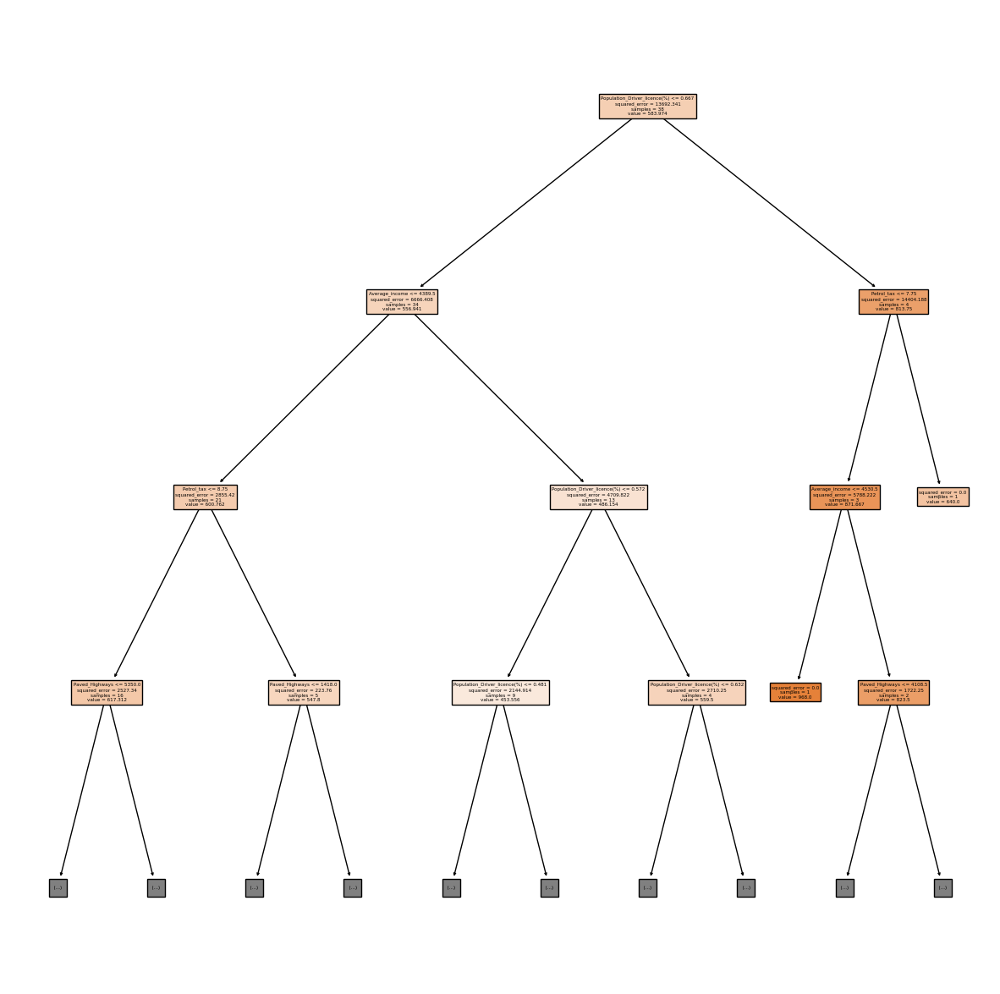

In [ ]:
#Since the tree is too big, we can use Max_depth to see the first level
#You can prune the view only with max_depth. This will not prune the actual model. To ease our understanding
#Remember the branch to the left is YES, and the branch to the right is ELSE
from sklearn import tree
plt.figure(figsize=(15,15))
tree.plot_tree(regressor, feature_names=list(X_train.columns), filled=True, max_depth=3)